# ENDOMETRIOSIS DETECTION WITH SSD_RESNET152 MODEL

## IMPORT REQUIRED LIBRARIES

In [2]:
import tensorflow as tf
print("Tensor version" + tf.__version__)
print(tf.config.list_physical_devices('GPU'))

import json
import shutil
import os
from sklearn.model_selection import train_test_split
import imgaug.augmenters as iaa
import imgaug as ia
import imageio
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

from object_detection.utils import dataset_util, label_map_util
from object_detection.dataset_tools import create_coco_tf_record
from object_detection.dataset_tools import tf_record_creation_util
from object_detection.dataset_tools import create_coco_tf_record

import pathlib
import matplotlib
import matplotlib.pyplot as plt
import tarfile
import random
import io
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline
import matplotlib.patches as patches
import re
from PIL import Image

Tensor version2.13.1
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
MODELS_CONFIG = {
    'ssd_resnet152': {
        'model_name': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8',
        'base_pipeline_file': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz',
        'batch_size': 32
    },
}

chosen_model = 'ssd_resnet152'

num_steps = 15000 #The more steps, the longer the training
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size']

In [7]:
%cd "/home/759635/models/research/deploy/"
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/home/759635/models/research/deploy
--2023-12-12 17:11:23--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.217.169.91, 142.250.179.251, 142.250.180.27, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|172.217.169.91|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 504180168 (481M) [application/x-tar]
Saving to: 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz'

100%[======================================>] 504,180,168 28.2MB/s   in 22s    

2023-12-12 17:11:46 (21.7 MB/s) - 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz' saved [504180168/504180168]



In [8]:
#download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

[Errno 2] No such file or directory: '/content/models/research/deploy'
/home/759635/models/research/deploy
--2023-12-12 17:12:05--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4535 (4.4K) [text/plain]
Saving to: 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config'

100%[======================================>] 4,535       --.-K/s   in 0s      

2023-12-12 17:12:05 (17.0 MB/s) - 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config' saved [4535/4535]



In [9]:
#File paths for the pipeline configuration and fine-tune checkpoint
pipeline_fname = '/home/759635/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint_ssd_resnet152 = '/home/759635/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'
label_map_file = '/home/759635/Glenda_v1.5_classes/label_map.pbtxt'

# Function to get the number of classes from the label map file
def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_file)

In [10]:
num_classes

4

In [11]:
'''
writing the custom configuration file by slotting the dataset, model checkpoint, and training parameters into the 
base pipeline file using regular expression

'''
train_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*'
test_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/test.record-*'

print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()

# Path for the sharded TFRecord files (use wildcard)
train_record_fname = train_record_pattern
test_record_fname = test_record_pattern

with open('pipeline_file.config', 'w') as f:
    # Replace fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint_ssd_resnet152), s)

    # Replace tfrecord files train and test with wildcard paths.
    s = re.sub('input_path: ".*?train.*?"', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub('input_path: ".*?val.*?"', 'input_path: "{}"'.format(test_record_fname), s)

    # Replace label_map_path
    s = re.sub('label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_file), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+', 'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+', 'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+', 'num_classes: {}'.format(num_classes), s)

    # Set fine-tune checkpoint type
    s = re.sub('fine_tune_checkpoint_type: ".*?"', 'fine_tune_checkpoint_type: "detection"', s)

    f.write(s)

writing custom configuration file


In [12]:
#Display the contents of the pipeline file
%cat /home/759635/models/research/deploy/pipeline_file.config

# SSD with Resnet 152 v1 FPN feature extractor, shared box predictor and focal
# loss (a.k.a Retinanet).
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 39.6 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {
        min_level: 3
        max_level: 7


In [13]:
# File path for the model training pipeline configuration
pipeline_file = '/home/759635/models/research/deploy/pipeline_file.config'

# Directory path where the trained model or model checkpoints will be saved
model_dir = '/home/759635/training_ssd_resnet152/'

### Model Training 

In [14]:
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-12-12 17:18:24.971868: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-12 17:18:46.394472: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-12 17:19:36.719130: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1212 17:19:36.722673 140297913911104 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 10000
I1212 17:

Instructions for updating:
Use fn_output_signature instead
W1212 17:21:00.504951 140295559808768 deprecation.py:569] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/deprecation.py:648: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Use fn_output_signature instead
I1212 17:21:03.162749 140295559808768 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
I1212 17:21:20.273140 140295559808768 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
I1212 17:21:35.617691 140295559808768 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
I1212 17:21:52.020876 140295559808768 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
2023-12-12 17:22:54.716615: W tensorflow/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) 

Traceback (most recent call last):
  File "/home/759635/models/research/object_detection/model_main_tf2.py", line 114, in <module>
    tf.compat.v1.app.run()
  File "/home/759635/.local/lib/python3.10/site-packages/tensorflow/python/platform/app.py", line 36, in run
    _run(main=main, argv=argv, flags_parser=_parse_flags_tolerate_undef)
  File "/home/ViperAppsFiles/python/anaconda/miniconda/3.10/lib/python3.10/site-packages/absl/app.py", line 308, in run
    _run_main(main, args)
  File "/home/ViperAppsFiles/python/anaconda/miniconda/3.10/lib/python3.10/site-packages/absl/app.py", line 254, in _run_main
    sys.exit(main(argv))
  File "/home/759635/models/research/object_detection/model_main_tf2.py", line 105, in main
    model_lib_v2.train_loop(
  File "/home/759635/.local/lib/python3.10/site-packages/object_detection/model_lib_v2.py", line 685, in train_loop
    losses_dict = _dist_train_step(train_input_iter)
  File "/home/759635/.local/lib/python3.10/site-packages/tensorflow/pytho

**Above is an illustration of the challenges I've encountered concerning limited memory when attempting to execute each model training session. In order to address this issue and facilitate the training session, I've had to diminish both the batch size and training steps. Regrettably, this adjustment has had an adverse impact on the model's performance during evaluation.**

In [ ]:
# Reducing the batch size from 32 to 16

In [15]:
MODELS_CONFIG = {
    'ssd_resnet152': {
        'model_name': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8',
        'base_pipeline_file': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz',
        'batch_size': 16
    },
}

chosen_model = 'ssd_resnet152'

num_steps = 15000 #The more steps, the longer the training
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size']

In [16]:
%cd '/home/759635/models/research/deploy/'
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/home/759635/models/research/deploy
--2023-12-12 17:33:38--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.180.27, 142.250.187.219, 142.250.187.251, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.180.27|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 504180168 (481M) [application/x-tar]
Saving to: 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz'

100%[======================================>] 504,180,168 44.8MB/s   in 11s    

2023-12-12 17:33:50 (43.0 MB/s) - 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz' saved [504180168/504180168]



In [17]:
#download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

[Errno 2] No such file or directory: '/content/models/research/deploy'
/home/759635/models/research/deploy
--2023-12-12 17:34:04--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4535 (4.4K) [text/plain]
Saving to: 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config'

100%[======================================>] 4,535       --.-K/s   in 0s      

2023-12-12 17:34:04 (27.8 MB/s) - 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config' saved [4535/4535]



In [18]:
'''
writing the custom configuration file by slotting the dataset, model checkpoint, and training parameters into the 
base pipeline file using regular expression

'''
train_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*'
test_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/test.record-*'

print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()

# Path for the sharded TFRecord files (use wildcard)
train_record_fname = train_record_pattern
test_record_fname = test_record_pattern

with open('pipeline_file.config', 'w') as f:
    # Replace fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint_ssd_resnet152), s)

    # Replace tfrecord files train and test with wildcard paths.
    s = re.sub('input_path: ".*?train.*?"', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub('input_path: ".*?val.*?"', 'input_path: "{}"'.format(test_record_fname), s)

    # Replace label_map_path
    s = re.sub('label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_file), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+', 'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+', 'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+', 'num_classes: {}'.format(num_classes), s)

    # Set fine-tune checkpoint type
    s = re.sub('fine_tune_checkpoint_type: ".*?"', 'fine_tune_checkpoint_type: "detection"', s)

    f.write(s)

writing custom configuration file


In [19]:
#Display the contents of the pipeline file
%cat /home/759635/models/research/deploy/pipeline_file.config

# SSD with Resnet 152 v1 FPN feature extractor, shared box predictor and focal
# loss (a.k.a Retinanet).
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 39.6 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {
        min_level: 3
        max_level: 7


### Model Training 

In [20]:
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-12-12 17:36:00.490124: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-12 17:36:25.406058: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-12 17:37:15.256205: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1212 17:37:15.259979 140227097323328 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 15000
I1212 17:

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
I1212 17:38:18.159357 140227097323328 cross_device_ops.py:617] Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
I1212 17:38:18.160209 140227097323328 cross_device_ops.py:617] Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
Instructions for updating:
Use fn_output_signature instead
W1212 17:38:20.947030 140224743220992 deprecation.py:569] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/deprecation.py:648: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with dtype is deprecated and will be removed in a future version.
Instructions

Traceback (most recent call last):
  File "/home/759635/models/research/object_detection/model_main_tf2.py", line 114, in <module>
    tf.compat.v1.app.run()
  File "/home/759635/.local/lib/python3.10/site-packages/tensorflow/python/platform/app.py", line 36, in run
    _run(main=main, argv=argv, flags_parser=_parse_flags_tolerate_undef)
  File "/home/ViperAppsFiles/python/anaconda/miniconda/3.10/lib/python3.10/site-packages/absl/app.py", line 308, in run
    _run_main(main, args)
  File "/home/ViperAppsFiles/python/anaconda/miniconda/3.10/lib/python3.10/site-packages/absl/app.py", line 254, in _run_main
    sys.exit(main(argv))
  File "/home/759635/models/research/object_detection/model_main_tf2.py", line 105, in main
    model_lib_v2.train_loop(
  File "/home/759635/.local/lib/python3.10/site-packages/object_detection/model_lib_v2.py", line 685, in train_loop
    losses_dict = _dist_train_step(train_input_iter)
  File "/home/759635/.local/lib/python3.10/site-packages/tensorflow/pytho

#### Reduced batch size to 16, but the mode still did not execute, now reducing it further to 8 and increasing the number of training steps to 20000

In [21]:
MODELS_CONFIG = {
    'ssd_resnet152': {
        'model_name': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8',
        'base_pipeline_file': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz',
        'batch_size': 8
    },
}

chosen_model = 'ssd_resnet152'

num_steps = 20000 #The more steps, the longer the training
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size']

In [22]:
%cd "/home/759635/models/research/deploy/"
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/home/759635/models/research/deploy
--2023-12-12 17:44:34--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 216.58.212.251, 172.217.169.91, 142.250.179.251, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|216.58.212.251|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 504180168 (481M) [application/x-tar]
Saving to: 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz'

100%[======================================>] 504,180,168 47.8MB/s   in 11s    

2023-12-12 17:44:45 (45.4 MB/s) - 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.tar.gz' saved [504180168/504180168]



In [23]:
#download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

[Errno 2] No such file or directory: '/content/models/research/deploy'
/home/759635/models/research/deploy
--2023-12-12 17:44:51--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4535 (4.4K) [text/plain]
Saving to: 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config'

100%[======================================>] 4,535       --.-K/s   in 0.03s   

2023-12-12 17:44:52 (142 KB/s) - 'ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8.config' saved [4535/4535]



In [24]:
'''
writing the custom configuration file by slotting the dataset, model checkpoint, and training parameters into the 
base pipeline file using regular expression

'''
train_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/train.record-*'
test_record_pattern = '/home/759635/Glenda_v1.5_classes/tfrecords/test.record-*'

print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()

# Path for the sharded TFRecord files (use wildcard)
train_record_fname = train_record_pattern
test_record_fname = test_record_pattern

with open('pipeline_file.config', 'w') as f:
    # Replace fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint_ssd_resnet152), s)

    # Replace tfrecord files train and test with wildcard paths.
    s = re.sub('input_path: ".*?train.*?"', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub('input_path: ".*?val.*?"', 'input_path: "{}"'.format(test_record_fname), s)

    # Replace label_map_path
    s = re.sub('label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_file), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+', 'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+', 'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+', 'num_classes: {}'.format(num_classes), s)

    # Set fine-tune checkpoint type
    s = re.sub('fine_tune_checkpoint_type: ".*?"', 'fine_tune_checkpoint_type: "detection"', s)

    f.write(s)

writing custom configuration file


In [25]:
#Display the contents of the pipeline file
%cat /home/759635/models/research/deploy/pipeline_file.config

# SSD with Resnet 152 v1 FPN feature extractor, shared box predictor and focal
# loss (a.k.a Retinanet).
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 39.6 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {
        min_level: 3
        max_level: 7


### Model Training 

In [26]:
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-12-12 17:47:24.911551: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-12 17:47:26.893863: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-12 17:47:32.491879: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1212 17:47:32.495567 139740274988864 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 20000
I1212 17:

Instructions for updating:
Use fn_output_signature instead
W1212 17:48:30.172724 139737920886528 deprecation.py:569] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/deprecation.py:648: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with dtype is deprecated and will be removed in a future version.
Instructions for updating:
Use fn_output_signature instead
I1212 17:48:32.728245 139737920886528 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
I1212 17:48:44.136714 139737920886528 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
I1212 17:48:54.184002 139737920886528 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
I1212 17:49:05.276276 139737920886528 api.py:460] feature_map_spatial_dims: [(128, 128), (64, 64), (32, 32), (16, 16), (8, 8)]
INFO:tensorflow:Step 100 per-step time 3.604s
I1212 17:54:30.362248 139740274988864 model_lib_v2.py

INFO:tensorflow:Step 1400 per-step time 2.813s
I1212 18:56:08.680526 139740274988864 model_lib_v2.py:705] Step 1400 per-step time 2.813s
INFO:tensorflow:{'Loss/classification_loss': 0.7989605,
 'Loss/localization_loss': 0.6227309,
 'Loss/regularization_loss': 16.518993,
 'Loss/total_loss': 17.940683,
 'learning_rate': 0.0319999}
I1212 18:56:08.681170 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.7989605,
 'Loss/localization_loss': 0.6227309,
 'Loss/regularization_loss': 16.518993,
 'Loss/total_loss': 17.940683,
 'learning_rate': 0.0319999}
INFO:tensorflow:Step 1500 per-step time 2.812s
I1212 19:00:49.886479 139740274988864 model_lib_v2.py:705] Step 1500 per-step time 2.812s
INFO:tensorflow:{'Loss/classification_loss': 0.7773686,
 'Loss/localization_loss': 0.62863445,
 'Loss/regularization_loss': 16.095541,
 'Loss/total_loss': 17.501545,
 'learning_rate': 0.03333325}
I1212 19:00:49.887119 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.7773686,


INFO:tensorflow:Step 2900 per-step time 2.800s
I1212 20:06:24.703716 139740274988864 model_lib_v2.py:705] Step 2900 per-step time 2.800s
INFO:tensorflow:{'Loss/classification_loss': 0.6398555,
 'Loss/localization_loss': 0.518897,
 'Loss/regularization_loss': 11.286729,
 'Loss/total_loss': 12.445481,
 'learning_rate': 0.039991677}
I1212 20:06:24.704363 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.6398555,
 'Loss/localization_loss': 0.518897,
 'Loss/regularization_loss': 11.286729,
 'Loss/total_loss': 12.445481,
 'learning_rate': 0.039991677}
INFO:tensorflow:Step 3000 per-step time 2.802s
I1212 20:11:04.855860 139740274988864 model_lib_v2.py:705] Step 3000 per-step time 2.802s
INFO:tensorflow:{'Loss/classification_loss': 0.7420435,
 'Loss/localization_loss': 0.59333503,
 'Loss/regularization_loss': 10.931776,
 'Loss/total_loss': 12.267155,
 'learning_rate': 0.039989725}
I1212 20:11:04.856486 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.742043

INFO:tensorflow:Step 4400 per-step time 2.808s
I1212 21:16:43.852166 139740274988864 model_lib_v2.py:705] Step 4400 per-step time 2.808s
INFO:tensorflow:{'Loss/classification_loss': 0.7372267,
 'Loss/localization_loss': 0.50061345,
 'Loss/regularization_loss': 6.9995804,
 'Loss/total_loss': 8.23742,
 'learning_rate': 0.039940834}
I1212 21:16:43.852814 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.7372267,
 'Loss/localization_loss': 0.50061345,
 'Loss/regularization_loss': 6.9995804,
 'Loss/total_loss': 8.23742,
 'learning_rate': 0.039940834}
INFO:tensorflow:Step 4500 per-step time 2.806s
I1212 21:21:24.482529 139740274988864 model_lib_v2.py:705] Step 4500 per-step time 2.806s
INFO:tensorflow:{'Loss/classification_loss': 0.7454668,
 'Loss/localization_loss': 0.5239888,
 'Loss/regularization_loss': 6.7810993,
 'Loss/total_loss': 8.050555,
 'learning_rate': 0.039935805}
I1212 21:21:24.483206 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.7454668,

INFO:tensorflow:Step 5900 per-step time 2.807s
I1212 22:26:59.943925 139740274988864 model_lib_v2.py:705] Step 5900 per-step time 2.807s
INFO:tensorflow:{'Loss/classification_loss': 0.7090059,
 'Loss/localization_loss': 0.48143035,
 'Loss/regularization_loss': 4.362948,
 'Loss/total_loss': 5.5533843,
 'learning_rate': 0.0398439}
I1212 22:26:59.944600 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.7090059,
 'Loss/localization_loss': 0.48143035,
 'Loss/regularization_loss': 4.362948,
 'Loss/total_loss': 5.5533843,
 'learning_rate': 0.0398439}
INFO:tensorflow:Step 6000 per-step time 2.808s
I1212 22:31:40.745998 139740274988864 model_lib_v2.py:705] Step 6000 per-step time 2.808s
INFO:tensorflow:{'Loss/classification_loss': 0.7200324,
 'Loss/localization_loss': 0.46013096,
 'Loss/regularization_loss': 4.2289,
 'Loss/total_loss': 5.4090633,
 'learning_rate': 0.0398358}
I1212 22:31:40.746640 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.7200324,
 'Lo

INFO:tensorflow:Step 7400 per-step time 2.804s
I1212 23:37:17.668895 139740274988864 model_lib_v2.py:705] Step 7400 per-step time 2.804s
INFO:tensorflow:{'Loss/classification_loss': 0.622992,
 'Loss/localization_loss': 0.3384643,
 'Loss/regularization_loss': 2.7489226,
 'Loss/total_loss': 3.710379,
 'learning_rate': 0.03970108}
I1212 23:37:17.669602 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.622992,
 'Loss/localization_loss': 0.3384643,
 'Loss/regularization_loss': 2.7489226,
 'Loss/total_loss': 3.710379,
 'learning_rate': 0.03970108}
INFO:tensorflow:Step 7500 per-step time 2.803s
I1212 23:41:57.923300 139740274988864 model_lib_v2.py:705] Step 7500 per-step time 2.803s
INFO:tensorflow:{'Loss/classification_loss': 0.74043846,
 'Loss/localization_loss': 0.41422024,
 'Loss/regularization_loss': 2.6668148,
 'Loss/total_loss': 3.8214736,
 'learning_rate': 0.03968994}
I1212 23:41:57.923942 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.74043846,


INFO:tensorflow:Step 8900 per-step time 2.859s
I1213 00:48:17.463232 139740274988864 model_lib_v2.py:705] Step 8900 per-step time 2.859s
INFO:tensorflow:{'Loss/classification_loss': 0.5476305,
 'Loss/localization_loss': 0.22960572,
 'Loss/regularization_loss': 1.7629619,
 'Loss/total_loss': 2.540198,
 'learning_rate': 0.039512724}
I1213 00:48:17.463901 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.5476305,
 'Loss/localization_loss': 0.22960572,
 'Loss/regularization_loss': 1.7629619,
 'Loss/total_loss': 2.540198,
 'learning_rate': 0.039512724}
INFO:tensorflow:Step 9000 per-step time 2.862s
I1213 00:53:03.627987 139740274988864 model_lib_v2.py:705] Step 9000 per-step time 2.862s
INFO:tensorflow:{'Loss/classification_loss': 0.5725294,
 'Loss/localization_loss': 0.234206,
 'Loss/regularization_loss': 1.7130692,
 'Loss/total_loss': 2.5198045,
 'learning_rate': 0.039498556}
I1213 00:53:03.628649 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.572529

INFO:tensorflow:Step 10400 per-step time 2.872s
I1213 02:00:08.832943 139740274988864 model_lib_v2.py:705] Step 10400 per-step time 2.872s
INFO:tensorflow:{'Loss/classification_loss': 0.58078593,
 'Loss/localization_loss': 0.19047774,
 'Loss/regularization_loss': 1.1647226,
 'Loss/total_loss': 1.9359862,
 'learning_rate': 0.039279256}
I1213 02:00:08.833595 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.58078593,
 'Loss/localization_loss': 0.19047774,
 'Loss/regularization_loss': 1.1647226,
 'Loss/total_loss': 1.9359862,
 'learning_rate': 0.039279256}
INFO:tensorflow:Step 10500 per-step time 2.873s
I1213 02:04:56.115842 139740274988864 model_lib_v2.py:705] Step 10500 per-step time 2.873s
INFO:tensorflow:{'Loss/classification_loss': 0.62885153,
 'Loss/localization_loss': 0.22150588,
 'Loss/regularization_loss': 1.1345441,
 'Loss/total_loss': 1.9849015,
 'learning_rate': 0.0392621}
I1213 02:04:56.116490 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss':

INFO:tensorflow:Step 11900 per-step time 2.874s
I1213 03:12:01.564522 139740274988864 model_lib_v2.py:705] Step 11900 per-step time 2.874s
INFO:tensorflow:{'Loss/classification_loss': 0.39314958,
 'Loss/localization_loss': 0.1642651,
 'Loss/regularization_loss': 0.8042201,
 'Loss/total_loss': 1.3616347,
 'learning_rate': 0.03900122}
I1213 03:12:01.565164 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.39314958,
 'Loss/localization_loss': 0.1642651,
 'Loss/regularization_loss': 0.8042201,
 'Loss/total_loss': 1.3616347,
 'learning_rate': 0.03900122}
INFO:tensorflow:Step 12000 per-step time 2.874s
I1213 03:16:49.013881 139740274988864 model_lib_v2.py:705] Step 12000 per-step time 2.874s
INFO:tensorflow:{'Loss/classification_loss': 0.43940786,
 'Loss/localization_loss': 0.13761066,
 'Loss/regularization_loss': 0.7857048,
 'Loss/total_loss': 1.3627234,
 'learning_rate': 0.038981114}
I1213 03:16:49.014536 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0

INFO:tensorflow:Step 13400 per-step time 2.878s
I1213 04:24:01.490751 139740274988864 model_lib_v2.py:705] Step 13400 per-step time 2.878s
INFO:tensorflow:{'Loss/classification_loss': 0.25508264,
 'Loss/localization_loss': 0.0984131,
 'Loss/regularization_loss': 0.58584374,
 'Loss/total_loss': 0.9393395,
 'learning_rate': 0.038679257}
I1213 04:24:01.491396 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.25508264,
 'Loss/localization_loss': 0.0984131,
 'Loss/regularization_loss': 0.58584374,
 'Loss/total_loss': 0.9393395,
 'learning_rate': 0.038679257}
INFO:tensorflow:Step 13500 per-step time 2.879s
I1213 04:28:49.437463 139740274988864 model_lib_v2.py:705] Step 13500 per-step time 2.879s
INFO:tensorflow:{'Loss/classification_loss': 0.3718306,
 'Loss/localization_loss': 0.13685925,
 'Loss/regularization_loss': 0.57488394,
 'Loss/total_loss': 1.0835738,
 'learning_rate': 0.03865625}
I1213 04:28:49.438110 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss'

INFO:tensorflow:Step 14900 per-step time 2.847s
I1213 05:35:38.169356 139740274988864 model_lib_v2.py:705] Step 14900 per-step time 2.847s
INFO:tensorflow:{'Loss/classification_loss': 0.38150418,
 'Loss/localization_loss': 0.14461827,
 'Loss/regularization_loss': 0.46911034,
 'Loss/total_loss': 0.9952328,
 'learning_rate': 0.03831411}
I1213 05:35:38.170001 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.38150418,
 'Loss/localization_loss': 0.14461827,
 'Loss/regularization_loss': 0.46911034,
 'Loss/total_loss': 0.9952328,
 'learning_rate': 0.03831411}
INFO:tensorflow:Step 15000 per-step time 2.848s
I1213 05:40:22.997164 139740274988864 model_lib_v2.py:705] Step 15000 per-step time 2.848s
INFO:tensorflow:{'Loss/classification_loss': 0.39545217,
 'Loss/localization_loss': 0.19485696,
 'Loss/regularization_loss': 0.46377942,
 'Loss/total_loss': 1.0540886,
 'learning_rate': 0.03828825}
I1213 05:40:22.997813 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss

INFO:tensorflow:Step 16400 per-step time 2.805s
I1213 06:46:45.294385 139740274988864 model_lib_v2.py:705] Step 16400 per-step time 2.805s
INFO:tensorflow:{'Loss/classification_loss': 0.4093639,
 'Loss/localization_loss': 0.16007972,
 'Loss/regularization_loss': 0.38480493,
 'Loss/total_loss': 0.95424855,
 'learning_rate': 0.037906628}
I1213 06:46:45.295046 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.4093639,
 'Loss/localization_loss': 0.16007972,
 'Loss/regularization_loss': 0.38480493,
 'Loss/total_loss': 0.95424855,
 'learning_rate': 0.037906628}
INFO:tensorflow:Step 16500 per-step time 2.804s
I1213 06:51:25.682896 139740274988864 model_lib_v2.py:705] Step 16500 per-step time 2.804s
INFO:tensorflow:{'Loss/classification_loss': 0.16076016,
 'Loss/localization_loss': 0.07407449,
 'Loss/regularization_loss': 0.37968212,
 'Loss/total_loss': 0.6145168,
 'learning_rate': 0.037877977}
I1213 06:51:25.683563 139740274988864 model_lib_v2.py:708] {'Loss/classification_l

INFO:tensorflow:Step 17900 per-step time 2.863s
I1213 07:57:43.949033 139740274988864 model_lib_v2.py:705] Step 17900 per-step time 2.863s
INFO:tensorflow:{'Loss/classification_loss': 0.2657876,
 'Loss/localization_loss': 0.097263165,
 'Loss/regularization_loss': 0.316688,
 'Loss/total_loss': 0.67973876,
 'learning_rate': 0.037457746}
I1213 07:57:43.949697 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.2657876,
 'Loss/localization_loss': 0.097263165,
 'Loss/regularization_loss': 0.316688,
 'Loss/total_loss': 0.67973876,
 'learning_rate': 0.037457746}
INFO:tensorflow:Step 18000 per-step time 2.856s
I1213 08:02:29.576364 139740274988864 model_lib_v2.py:705] Step 18000 per-step time 2.856s
INFO:tensorflow:{'Loss/classification_loss': 0.40470397,
 'Loss/localization_loss': 0.18403532,
 'Loss/regularization_loss': 0.31312668,
 'Loss/total_loss': 0.90186596,
 'learning_rate': 0.037426375}
I1213 08:02:29.577012 139740274988864 model_lib_v2.py:708] {'Loss/classification_lo

INFO:tensorflow:Step 19400 per-step time 2.874s
I1213 09:09:46.275101 139740274988864 model_lib_v2.py:705] Step 19400 per-step time 2.874s
INFO:tensorflow:{'Loss/classification_loss': 0.23705664,
 'Loss/localization_loss': 0.09730711,
 'Loss/regularization_loss': 0.31197193,
 'Loss/total_loss': 0.64633566,
 'learning_rate': 0.036968507}
I1213 09:09:46.275747 139740274988864 model_lib_v2.py:708] {'Loss/classification_loss': 0.23705664,
 'Loss/localization_loss': 0.09730711,
 'Loss/regularization_loss': 0.31197193,
 'Loss/total_loss': 0.64633566,
 'learning_rate': 0.036968507}
INFO:tensorflow:Step 19500 per-step time 2.874s
I1213 09:14:33.713361 139740274988864 model_lib_v2.py:705] Step 19500 per-step time 2.874s
INFO:tensorflow:{'Loss/classification_loss': 0.1924555,
 'Loss/localization_loss': 0.07708803,
 'Loss/regularization_loss': 0.310061,
 'Loss/total_loss': 0.5796045,
 'learning_rate': 0.036934484}
I1213 09:14:33.714011 139740274988864 model_lib_v2.py:708] {'Loss/classification_lo

#### THE MODEL PERFORMANCE METRICS

In [27]:
#run model evaluation to obtain performance metrics
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir} \

2023-12-13 10:12:33.622908: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-13 10:13:05.567130: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W1213 10:14:16.298366 140038286411584 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I1213 10:14:16.298913 140038286411584 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1213 10:14:16.298996 140038286411584 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1213 10:14:16.299092 140038286411584 config_util.py:552] Maybe o

INFO:tensorflow:Performing evaluation on 38 images.
I1213 10:15:20.213604 140038286411584 coco_evaluation.py:293] Performing evaluation on 38 images.
creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...
I1213 10:15:20.214358 140038286411584 coco_tools.py:116] Loading and preparing annotation results...
INFO:tensorflow:DONE (t=0.00s)
I1213 10:15:20.217289 140038286411584 coco_tools.py:138] DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.14s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.044
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.111
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.028
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.045
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100

In [28]:
%load_ext tensorboard
%tensorboard --logdir '/home/759635/training_ssd_resnet152/train'

In [29]:
#see where the model saved weights
%ls '/home/759635/training_ssd_resnet152/'

checkpoint                   ckpt-21.data-00000-of-00001
ckpt-17.data-00000-of-00001  ckpt-21.index
ckpt-17.index                ckpt-22.data-00000-of-00001
ckpt-18.data-00000-of-00001  ckpt-22.index
ckpt-18.index                ckpt-23.data-00000-of-00001
ckpt-19.data-00000-of-00001  ckpt-23.index
ckpt-19.index                eval/
ckpt-20.data-00000-of-00001  train/
ckpt-20.index


In [30]:
output_directory = '/home/759635/fine_tuned_model_ssd_resnet152/'

#exporting the trained model for inference
last_model_path = '/home/759635/training_ssd_resnet152/'
print(last_model_path)
!python /home/759635/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/home/759635/training_ssd_resnet152/
2023-12-13 10:35:35.113567: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-12-13 10:35:39.258097: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-12-13 10:36:06.977826: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W1213 10:36:07.705615 139904131135296 dep

# Run Inference on Test Images with Custom TensorFlow2 Object Detector

In [31]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [32]:
filenames = list(pathlib.Path('/home/759635/training_ssd_resnet152/').glob('*.index'))

filenames.sort()
print(filenames)

#recover the saved model
pipeline_config = pipeline_file

model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/home/759635/training_ssd_resnet152/ckpt-17.index'), PosixPath('/home/759635/training_ssd_resnet152/ckpt-18.index'), PosixPath('/home/759635/training_ssd_resnet152/ckpt-19.index'), PosixPath('/home/759635/training_ssd_resnet152/ckpt-20.index'), PosixPath('/home/759635/training_ssd_resnet152/ckpt-21.index'), PosixPath('/home/759635/training_ssd_resnet152/ckpt-22.index'), PosixPath('/home/759635/training_ssd_resnet152/ckpt-23.index')]


2023-12-13 10:38:07.424040: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43419 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6


In [33]:
'''
This code loads and processes a label map file for inference decoding. Then create a dictionary (`label_map_dict`) 
that maps label names to category information for easy interpretation of model results.
'''
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

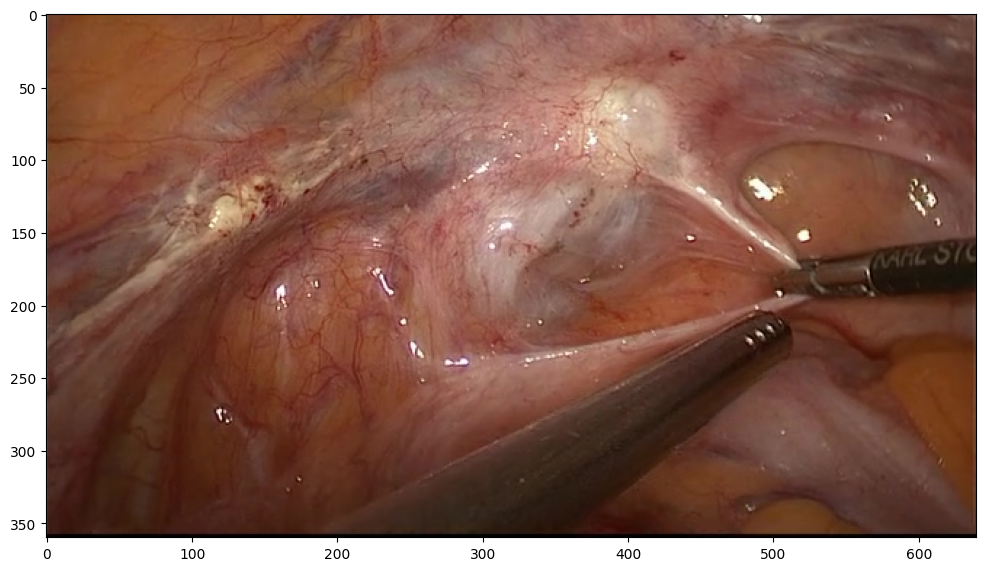

In [50]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('1_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


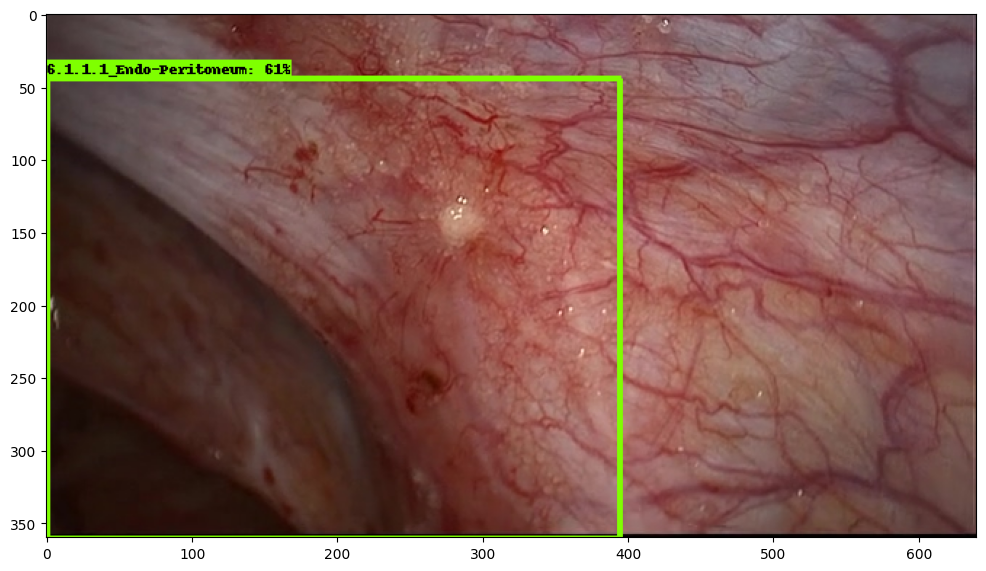

In [38]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('2_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


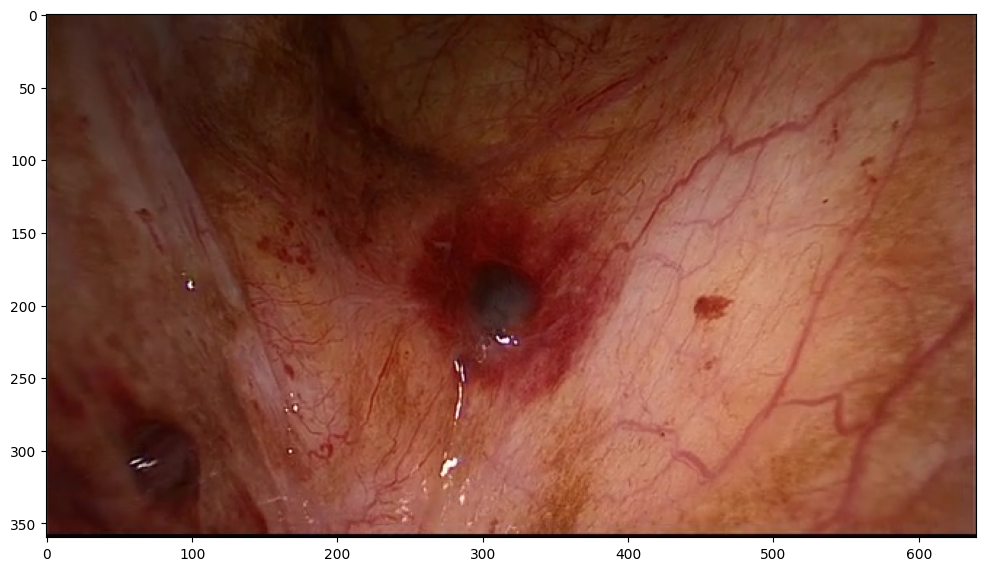

In [316]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('3_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


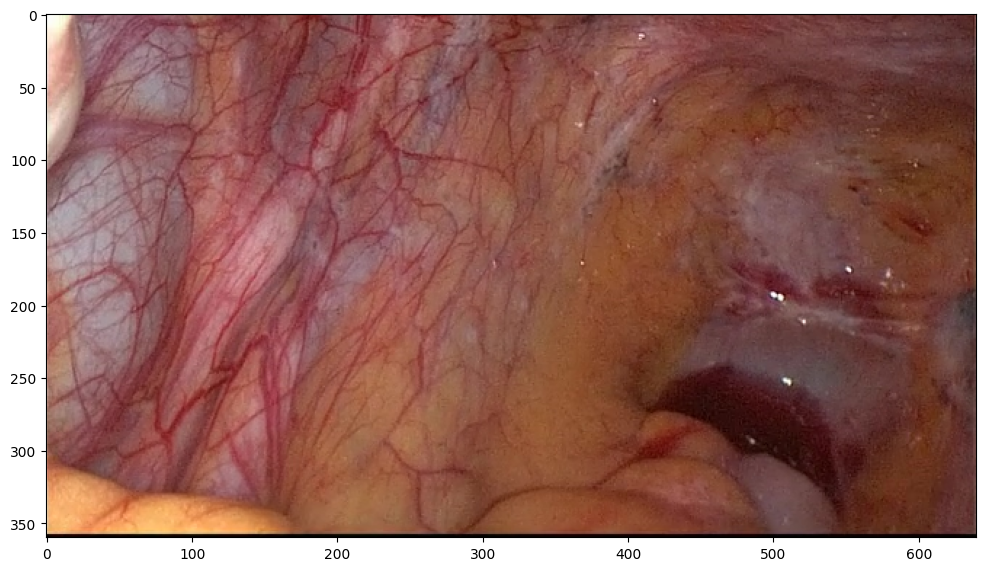

In [322]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('4_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


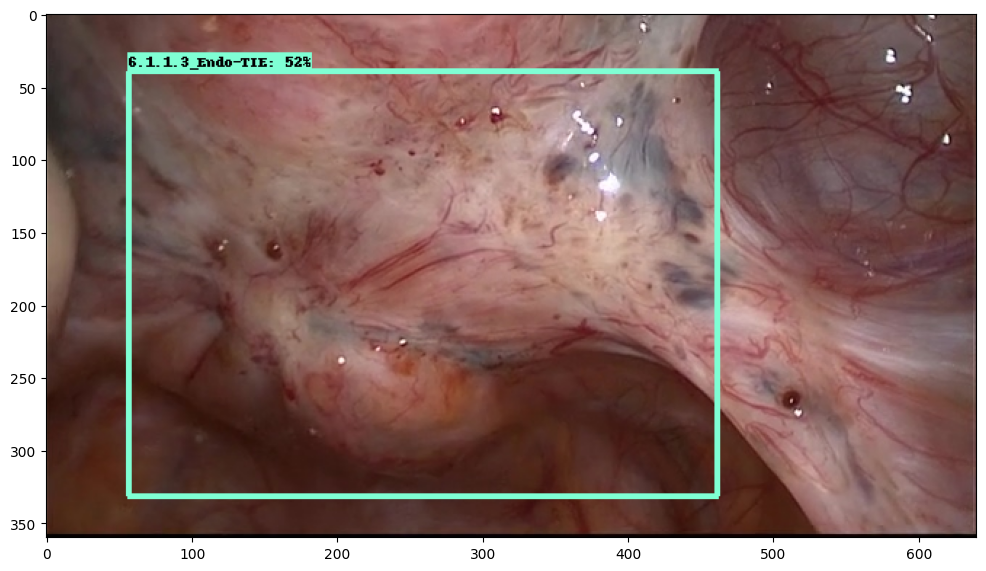

In [43]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('5_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


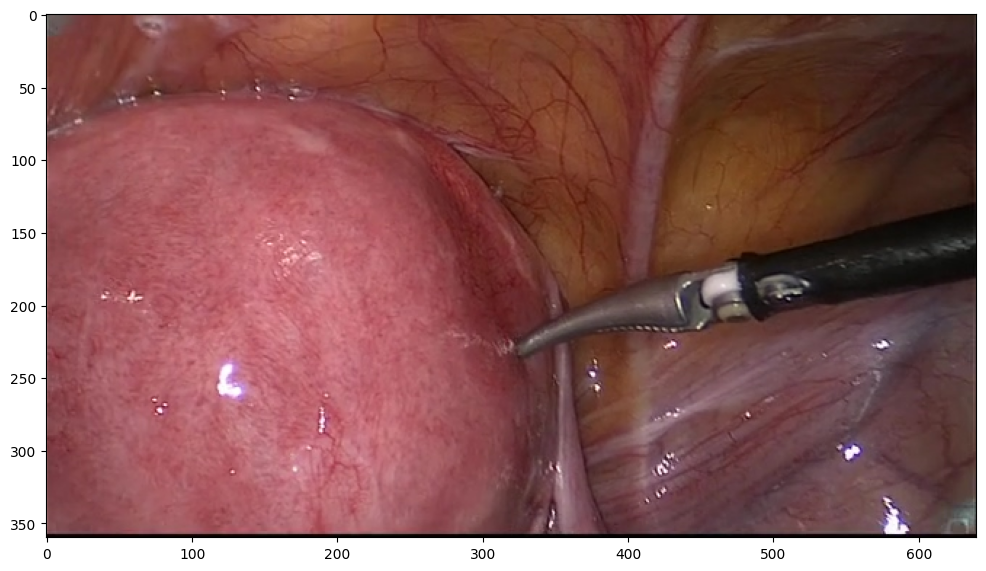

In [61]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('6_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


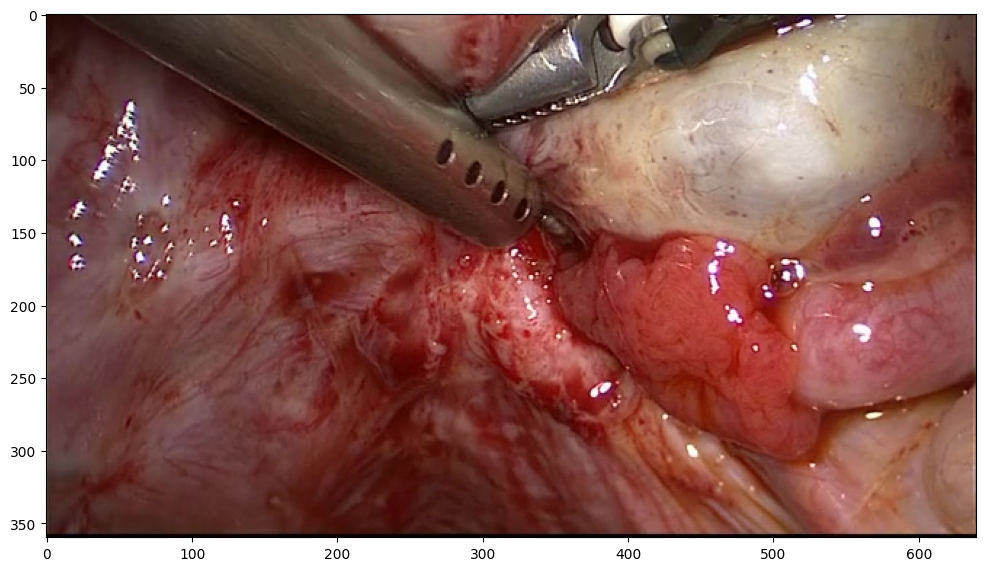

In [318]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('7_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


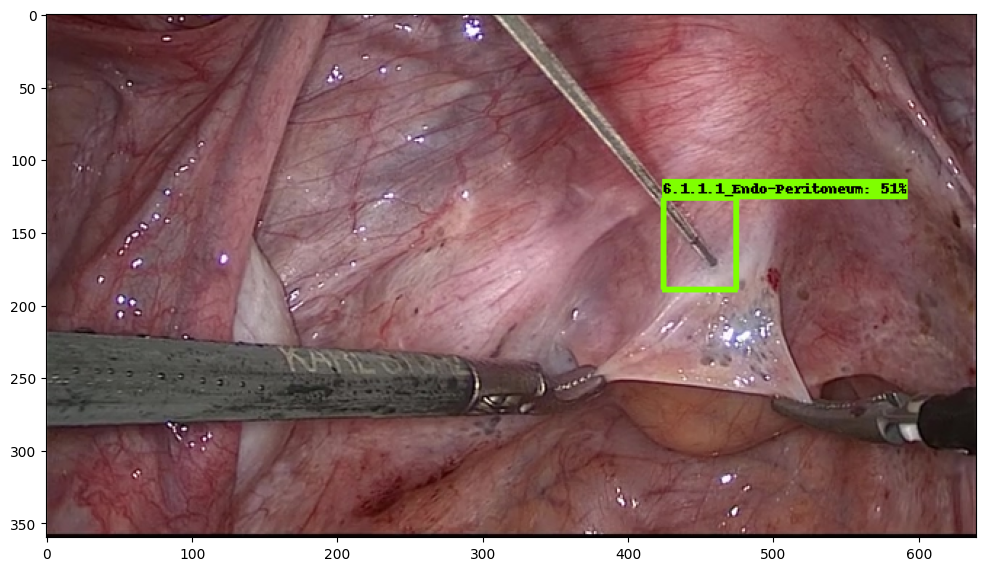

In [100]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('8_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


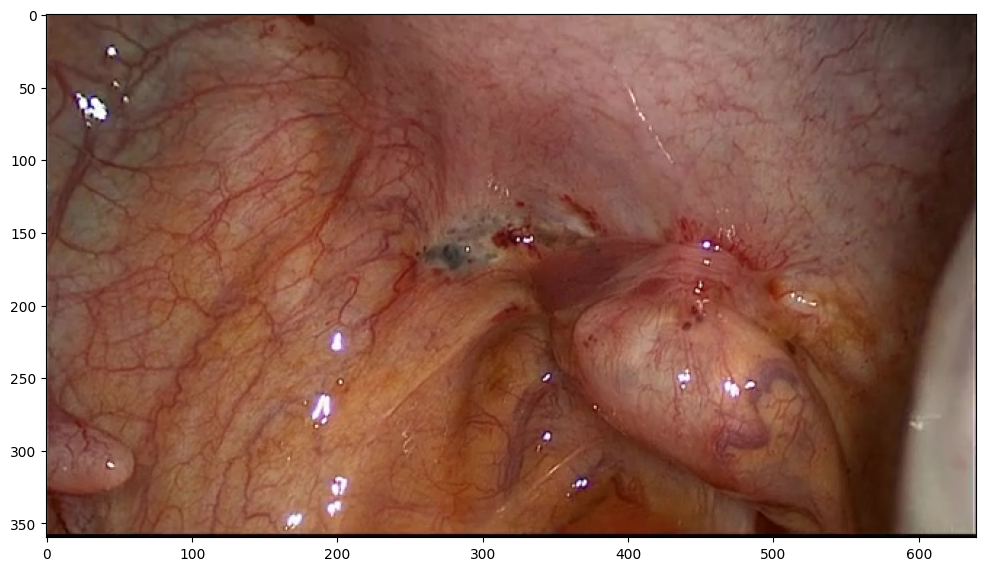

In [324]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('9_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


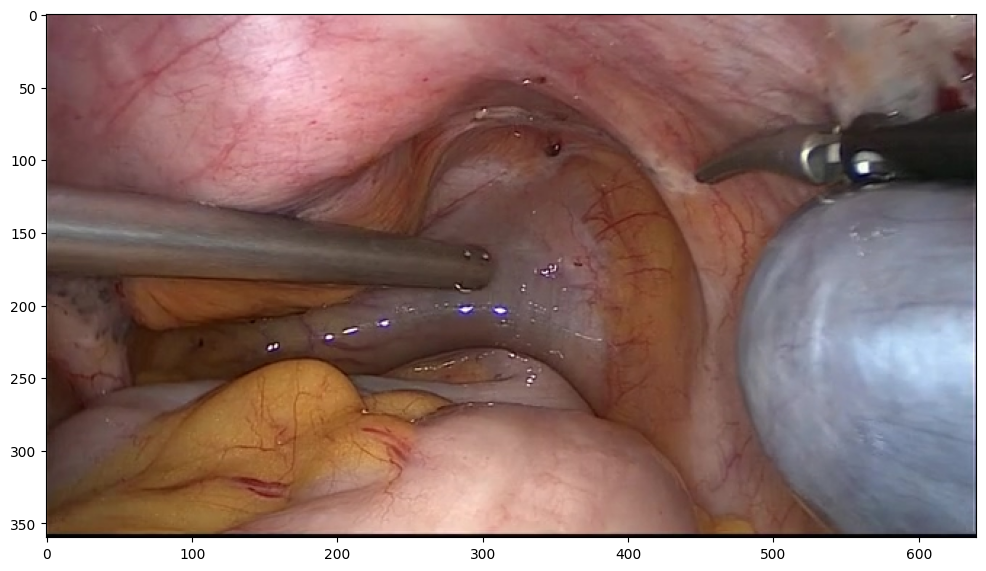

In [152]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('10_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


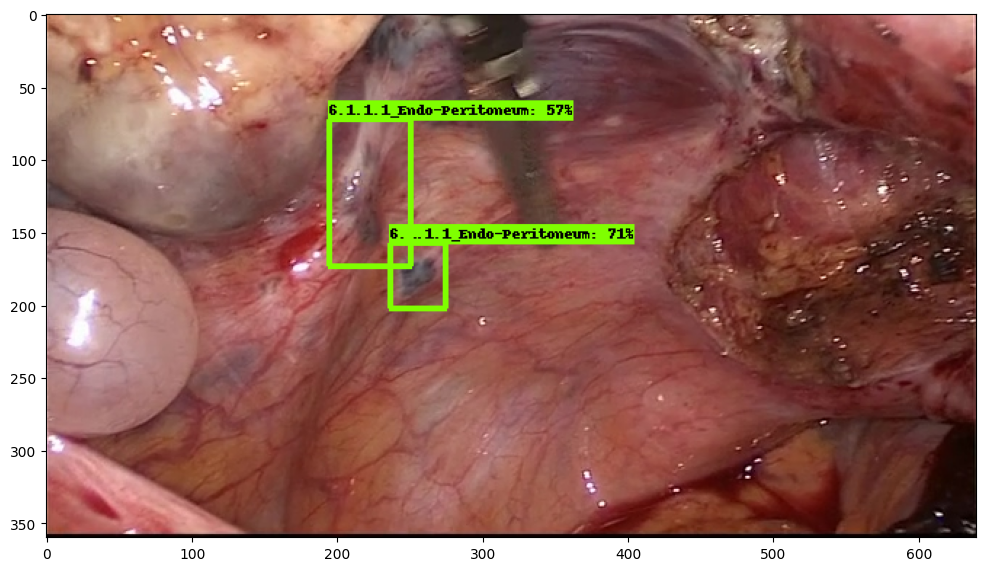

In [157]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('11_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


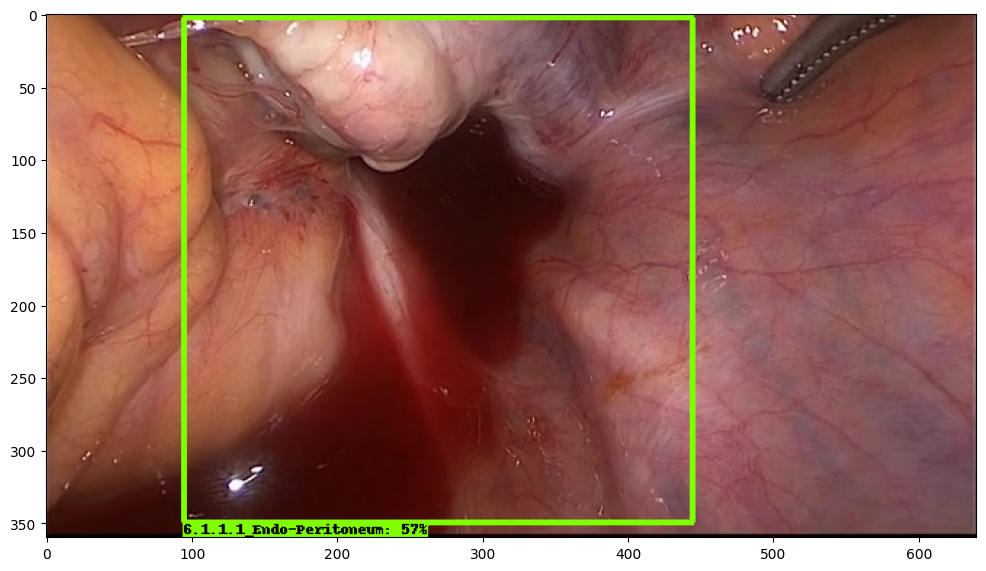

In [158]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('12_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


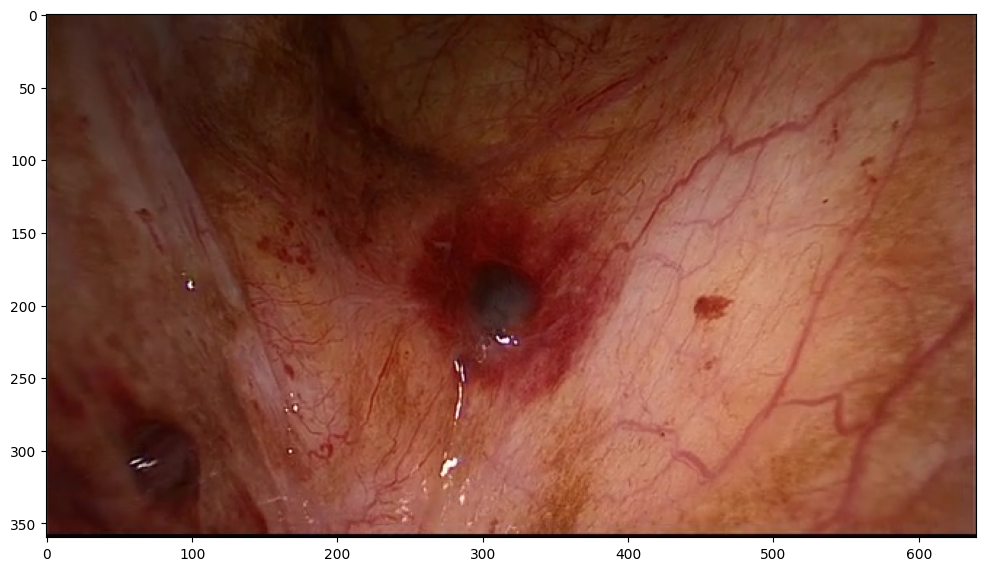

In [164]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('13_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


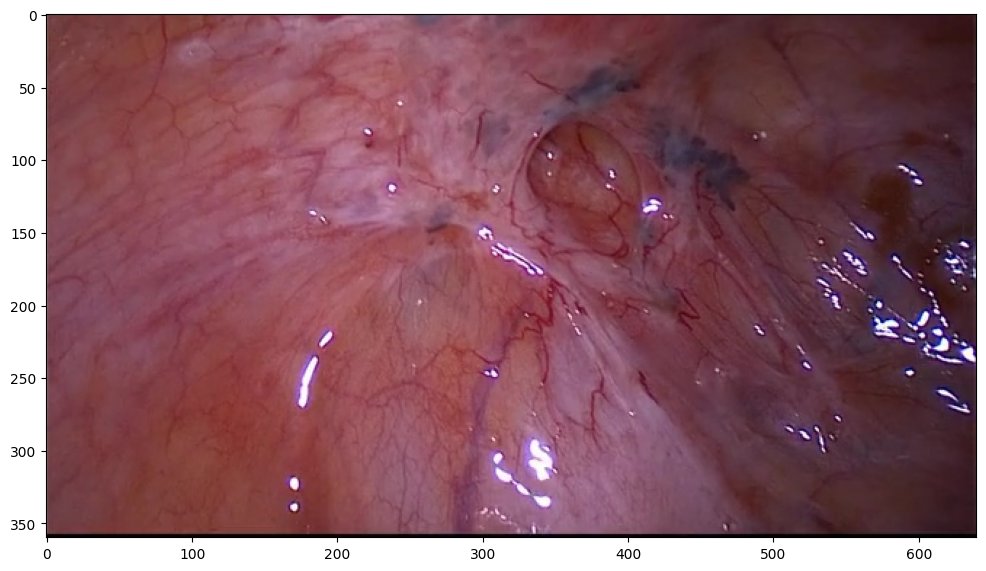

In [233]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('14_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


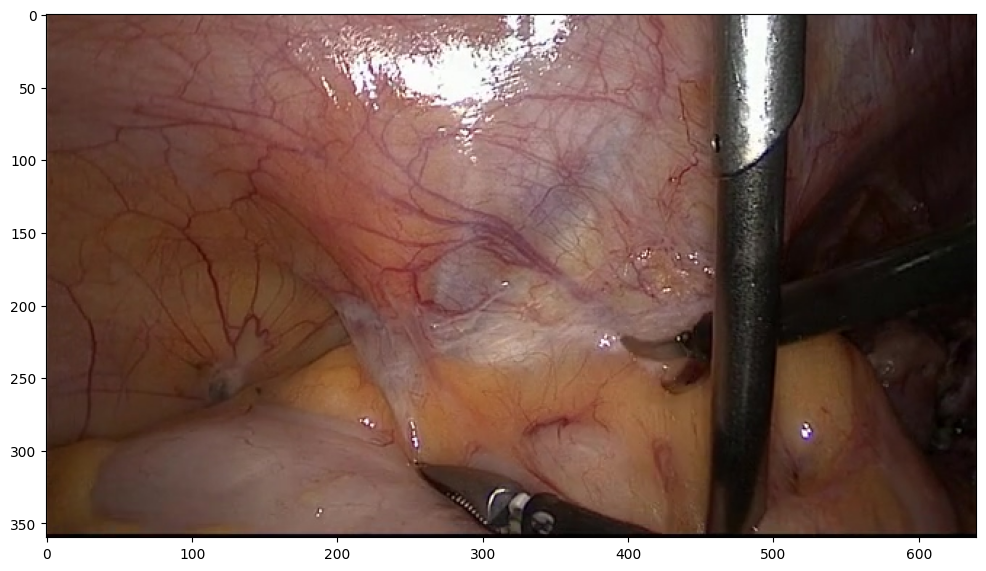

In [309]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('15_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


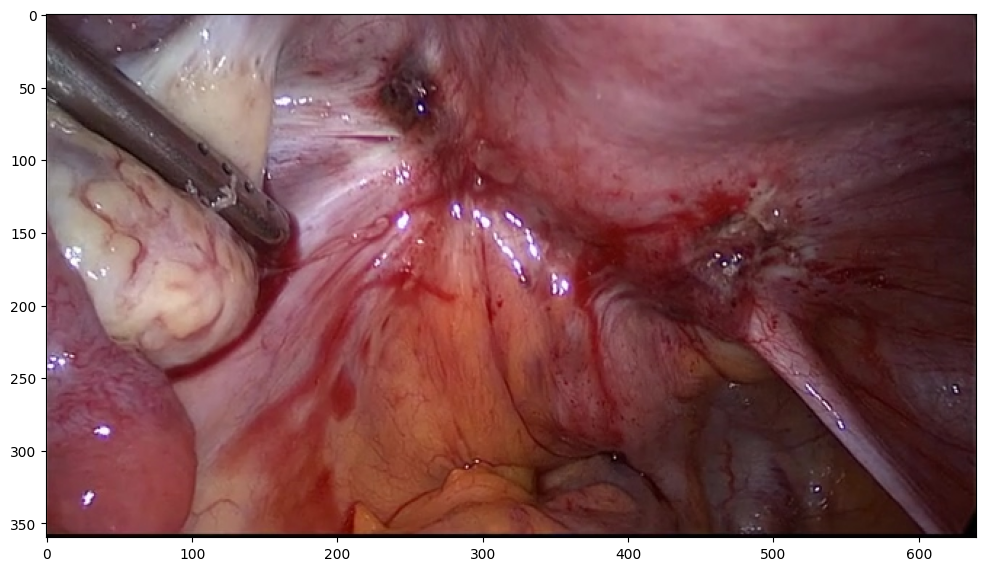

In [310]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('16_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


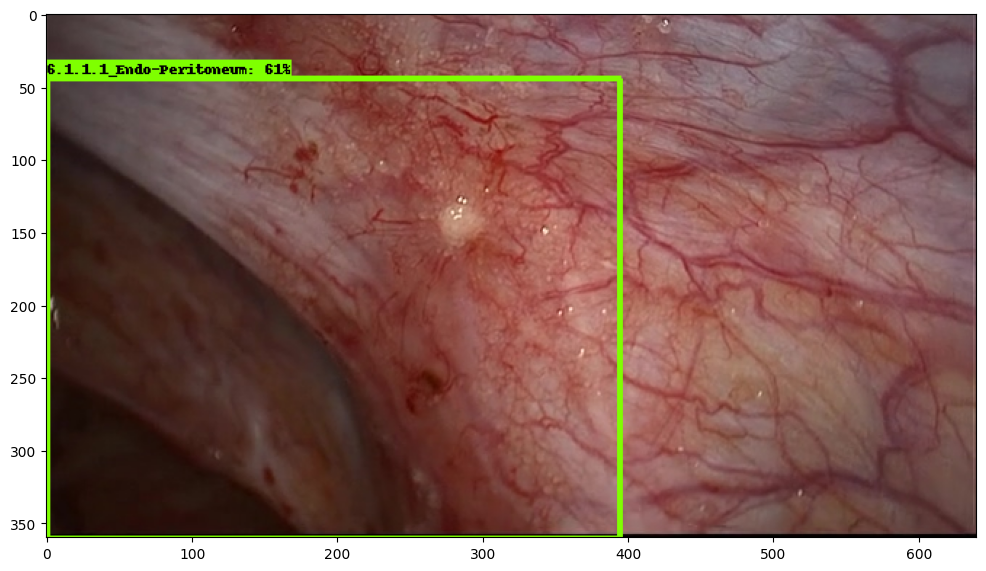

In [255]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('17_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


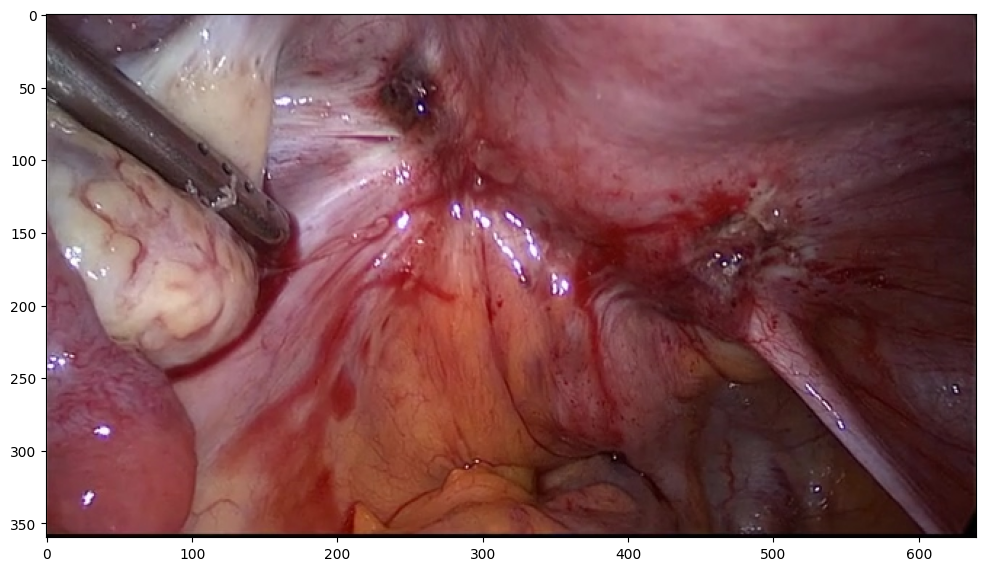

In [291]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('18_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


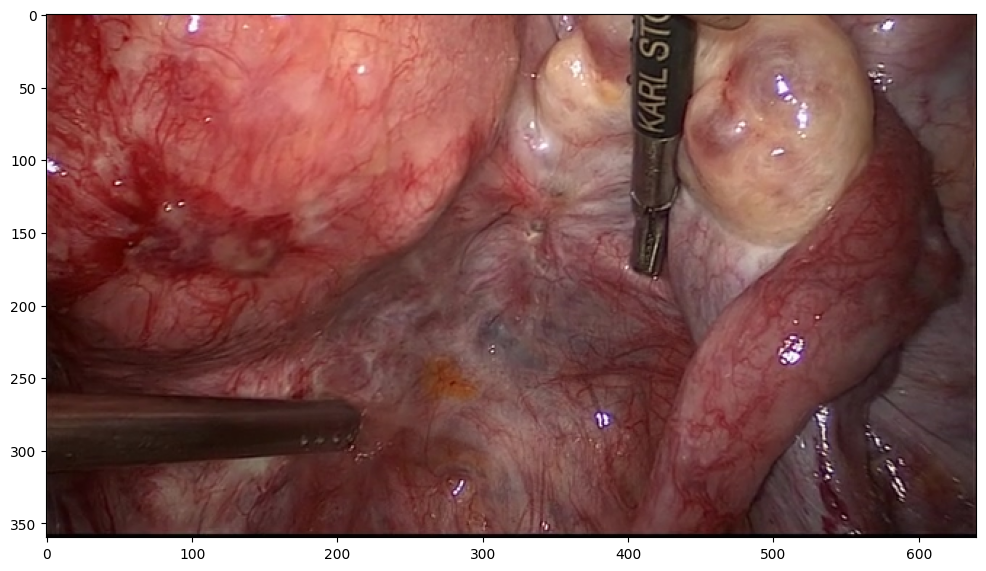

In [266]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('19_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()


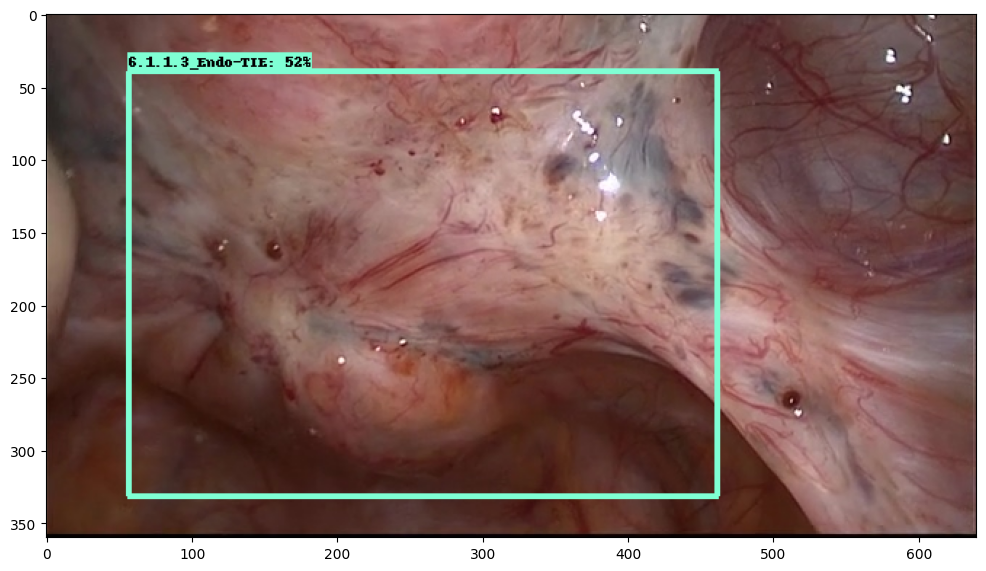

In [283]:
# running detector on test image

TEST_IMAGE_PATHS = glob.glob('/home/759635/Glenda_v1.5_classes/test_frames/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)

# Save the image with bounding boxes and labels
plt.savefig('20_ssd_resnet152.jpg', bbox_inches='tight')

# Show the image
plt.show()
